# 1.Define Business Case / Problem Statements

In the competitive mobile phone market companies wantto understand sales data of mobile phones
and factors which drive the prices.
The objective is to find out some relation between features of a mobile phone(eg:- RAM,Internal
Memory, etc) and its selling price. In this problem, we do not have to predict theactual price but a
price range indicating how high the price is.

# 2.Import Basic Libraries.

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import sweetviz as sv 
import pickle 

%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

C:\Users\HP\AppData\Roaming\Python\Python311\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
from pandas_profiling import ProfileReport
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.decomposition import PCA

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC


# 3.Load Data

In [3]:
df = pd.read_csv('data_mobile_price_range.csv')
df

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0


In [4]:
# Overview Report of Dataset

prof = ProfileReport(df)
prof.to_file(output_file='CellPriRg.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# 4.Domain Analysis

# 5.Basic Checks (shape,head,tail,dtype,describe,Info,Isnull,duplicated,unique-if you have categorical column.value_count)

In [5]:
# To check number of rows and columns.

df.shape

(2000, 21)

In [6]:
#To show first five rows

df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [7]:
#To show random five rows

df.sample(5)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
234,528,0,1.7,0,12,1,6,0.8,142,2,...,574,637,3256,9,8,6,1,1,0,2
1029,1658,1,1.4,1,0,1,38,0.3,159,5,...,51,739,2609,12,11,19,1,0,0,2
98,657,0,2.5,0,0,0,37,0.7,141,2,...,476,961,1412,14,3,18,0,1,0,0
714,1188,1,1.4,1,0,1,9,0.6,114,2,...,1339,1558,2896,12,11,16,1,0,1,3
1971,538,0,1.1,1,0,1,25,0.3,163,7,...,455,537,2215,9,3,17,1,1,1,1


In [8]:
#To show last five rows

df.tail()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0
1999,510,1,2.0,1,5,1,45,0.9,168,6,...,483,754,3919,19,4,2,1,1,1,3


In [9]:
#To check dtatypes of the columns

df.dtypes

battery_power      int64
blue               int64
clock_speed      float64
dual_sim           int64
fc                 int64
four_g             int64
int_memory         int64
m_dep            float64
mobile_wt          int64
n_cores            int64
pc                 int64
px_height          int64
px_width           int64
ram                int64
sc_h               int64
sc_w               int64
talk_time          int64
three_g            int64
touch_screen       int64
wifi               int64
price_range        int64
dtype: object

In [10]:
#To check statistical information

df.describe().T

,count,mean,std,min,25%,50%,75%,max
battery_power,2000.0,1238.51850,439.418206,501.0,851.75,1226.0,1615.25,1998.0
blue,2000.0,0.49500,0.500100,0.0,0.00,0.0,1.00,1.0
clock_speed,2000.0,1.52225,0.816004,0.5,0.70,1.5,2.20,3.0
dual_sim,2000.0,0.50950,0.500035,0.0,0.00,1.0,1.00,1.0
fc,2000.0,4.30950,4.341444,0.0,1.00,3.0,7.00,19.0
four_g,2000.0,0.52150,0.499662,0.0,0.00,1.0,1.00,1.0
int_memory,2000.0,32.04650,18.145715,2.0,16.00,32.0,48.00,64.0
m_dep,2000.0,0.50175,0.288416,0.1,0.20,0.5,0.80,1.0
mobile_wt,2000.0,140.24900,35.399655,80.0,109.00,141.0,170.00,200.0
n_cores,2000.0,4.52050,2.287837,1.0,3.00,4.0,7.00,8.0


In [11]:
# To check basic information

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [12]:
# To check Null values

df.isnull().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

In [13]:
# Percentage of duplicated values

df.duplicated().sum().mean()*100

0.0

# 6.Exploratory Data Analysis

***i).Univariate Analysis***

In [14]:
#Sweetviz Report for univariate data analysis
my_report = sv.analyze(df)

my_report.show_html()

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


***ii).Bivariate Analysis***

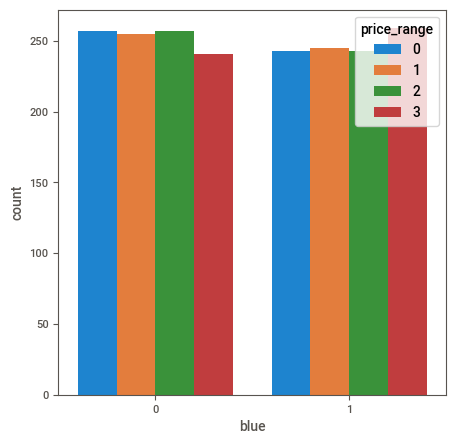

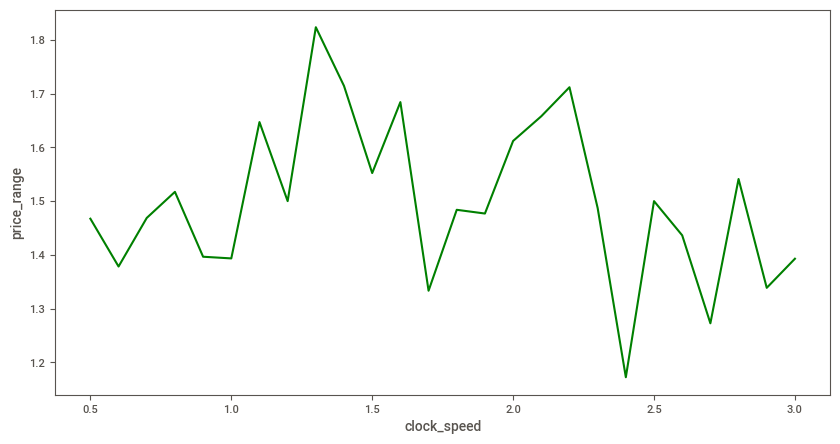

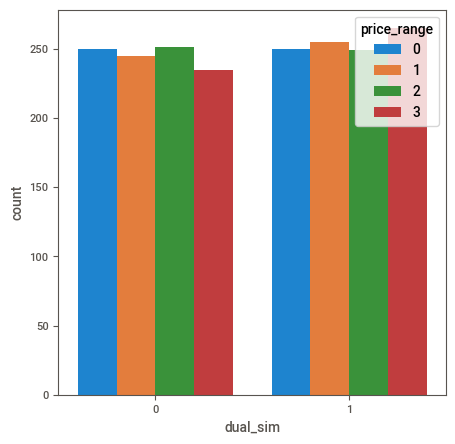

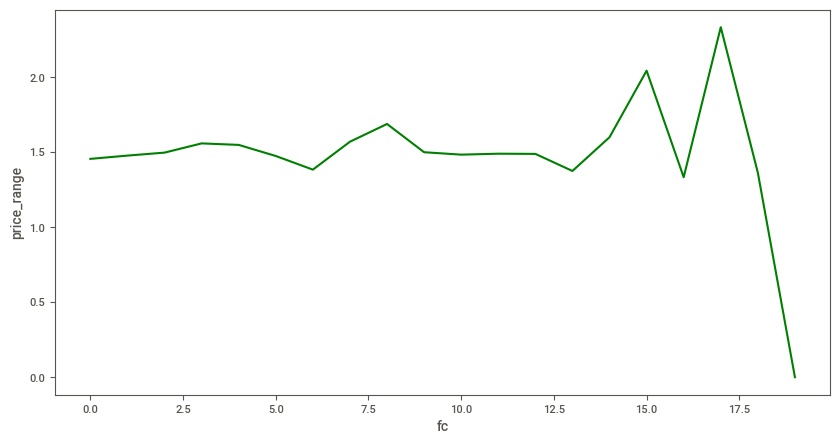

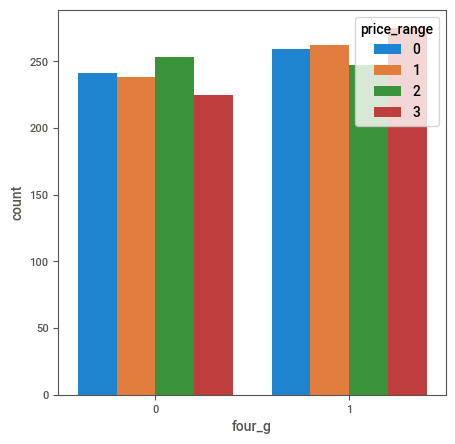

...

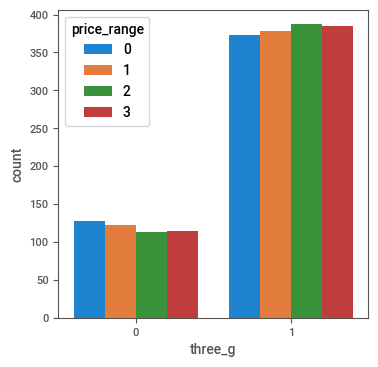

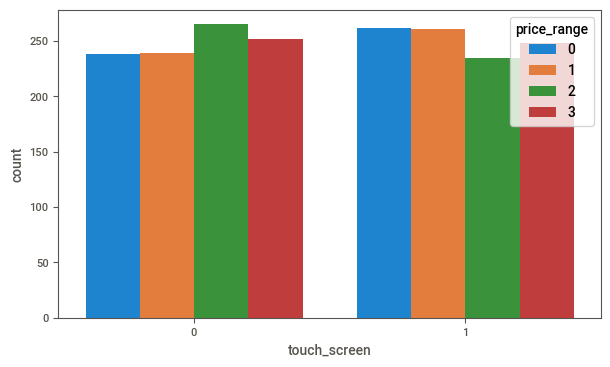

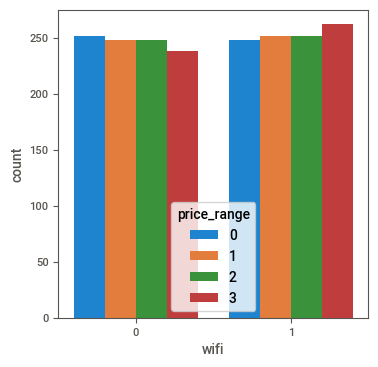

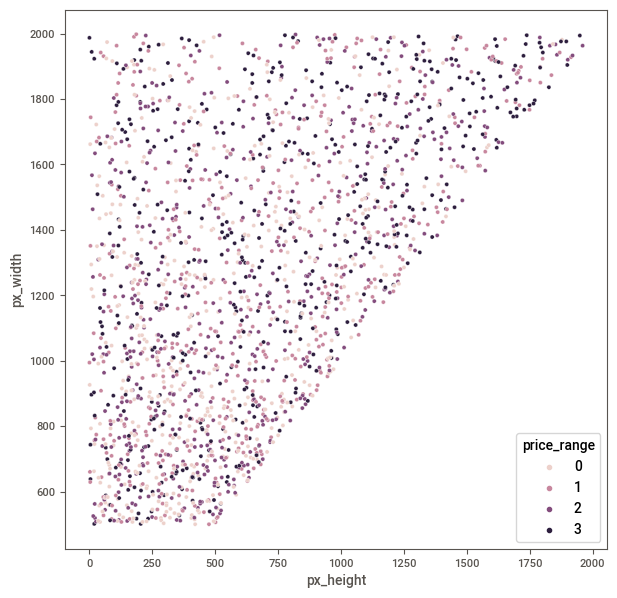

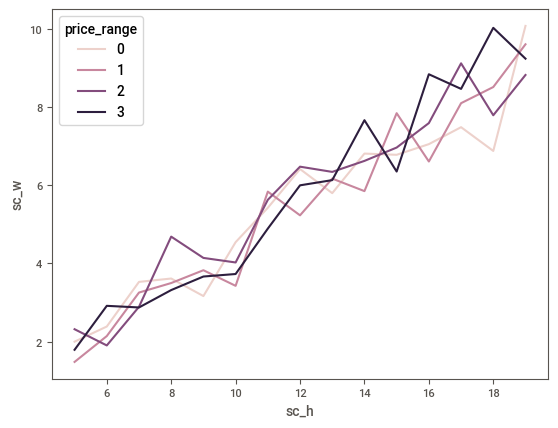

In [15]:
#Relation between blue and price_range
plt.figure(figsize=(5,5))
sns.countplot(data=df,x='blue',hue='price_range',) # Customize colour
plt.show()

#Relation between clock_speed and price_range
fig,ax=plt.subplots(figsize=(10,5))
sns.lineplot(data=df,x='clock_speed',y='price_range',ci=None,color='g')
plt.show()

#Relation between dual_sim and price_range

plt.figure(figsize=(5,5))
sns.countplot(data=df,x='dual_sim',hue='price_range',) # Customize colour
plt.show()

#Relation between fc and price_range

fig,ax=plt.subplots(figsize=(10,5))
sns.lineplot(data=df,x='fc',y='price_range',ci=None,color='g')
plt.show()

#Relation between four_g and price_range
plt.figure(figsize=(5,5))
sns.countplot(data=df,x='four_g',hue='price_range',) # Customize colour
plt.show()

#Relation between int_memory and price_range

plt.figure(figsize=(10,4))
sns.histplot(data=df,x='int_memory',hue='price_range')
plt.show()

# Relation between m_dep and price_range

fig,ax=plt.subplots(figsize=(10,5))
sns.lineplot(data=df,x='m_dep',y='price_range',ci=None,color='g')
plt.show()

# Relation between mobile_wt and price_range

plt.figure(figsize=(10,4))
sns.histplot(data=df,x='mobile_wt',hue='price_range')
plt.show()

#Relation between n_cores and price_range

plt.figure(figsize=(10,4))
sns.countplot(data=df,x='n_cores',hue='price_range')
plt.show()

# Relation between pc and price_range

fig,ax=plt.subplots(figsize=(10,5))
sns.lineplot(data=df,x='pc',y='price_range',ci=None,color='g')
plt.show()

#Relataion between px_height and price_range

plt.figure(figsize=(7,4))
sns.histplot(data=df,x='px_height',hue='price_range')
plt.show()

#Relation between px_weight and price_range

plt.figure(figsize=(7,4))
sns.histplot(data=df,x='px_width',hue='price_range')
plt.show()


#Relation between ram and price_range

plt.figure(figsize=(7,4))
sns.histplot(data=df,x='ram',hue='price_range')
plt.show()


#Relation between sc_h and price_range

fig,ax=plt.subplots(figsize=(10,5))
sns.lineplot(data=df,x='sc_h',y='price_range',ci=None,color='g')
plt.show()

#Relation between sc_h and price_range

fig,ax=plt.subplots(figsize=(10,5))
sns.lineplot(data=df,x='sc_w',y='price_range',ci=None,color='g')
plt.show()


#Relation between talk_time and price_range

fig,ax=plt.subplots(figsize=(10,5))
sns.lineplot(data=df,x='talk_time',y='price_range',ci=None,color='g')
plt.show()


#Relation between three_g and price_range

plt.figure(figsize=(4,4))
sns.countplot(data=df,x='three_g',hue='price_range')
plt.show()


# Relation between touch_screen and price_range

plt.figure(figsize=(7,4))
sns.countplot(data=df,x='touch_screen',hue='price_range')
plt.show()


# Relation between wifi and price_range

plt.figure(figsize=(4,4))
sns.countplot(data=df,x='wifi',hue='price_range')
plt.show()


#Relation of px_height and px_width with price_range.

plt.figure(figsize=(7,7))
sns.scatterplot(data=df,x='px_height',y='px_width',hue='price_range') # Customize colour
plt.show()


#Relation of sc_h and sc_w with price_range

sns.lineplot(data=df,x='sc_h',y='sc_w',hue='price_range',ci=None) # Customize colour
plt.show()

***iii).Multivariate Analysis***

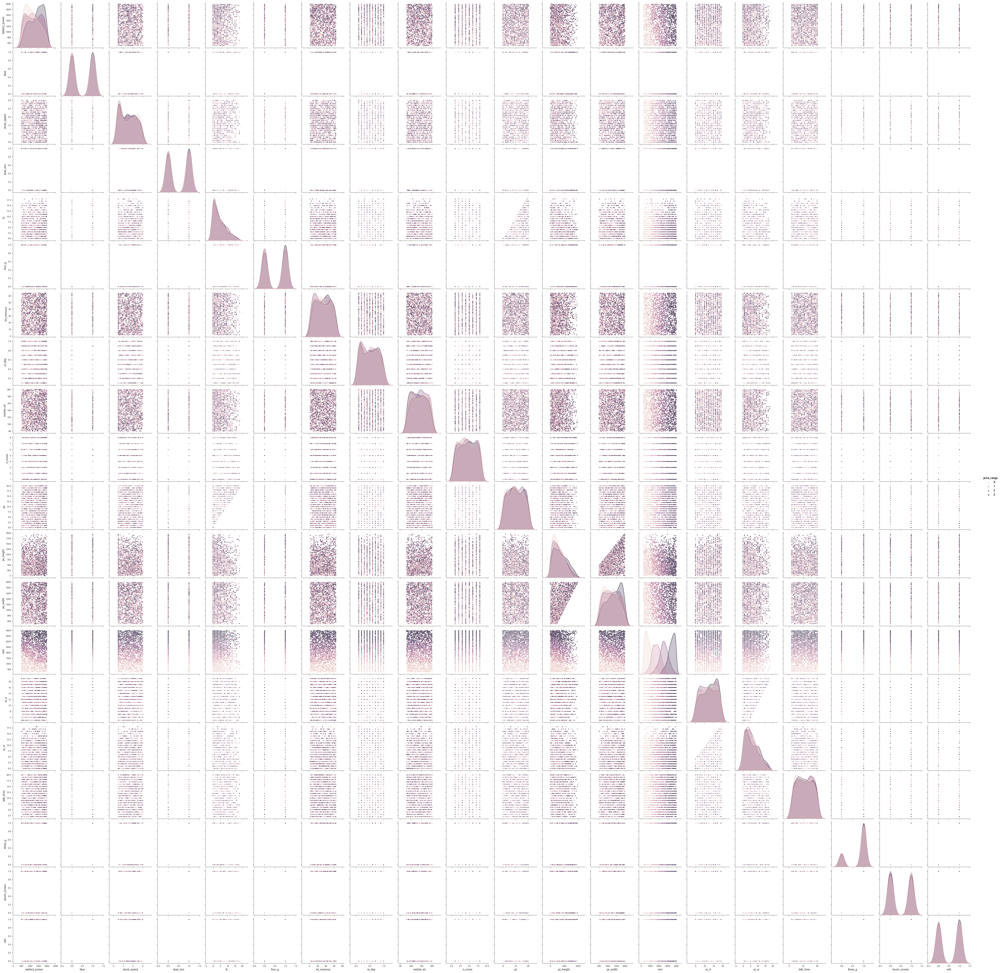

In [16]:
# It gives powerwise relation of each column in the dataset.

sns.pairplot(data=df,hue='price_range')
plt.show()

# 7.Data Preprocessing.(Handling Missing Value,Handling Outliers,Handling Skewness,Handling Categorical Data)

***i).Handling Outliers***

In [17]:
df.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

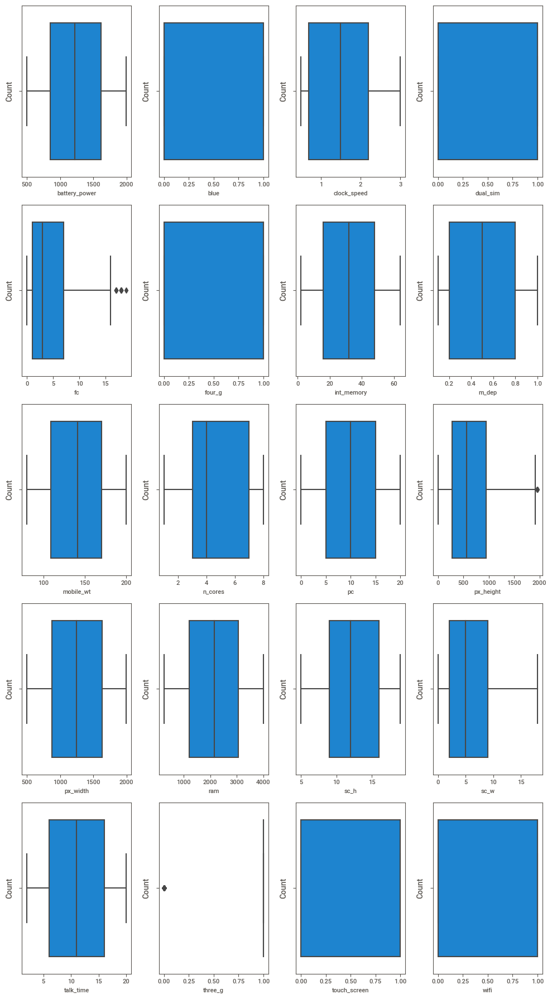

In [18]:
# check outliers.

plt.figure(figsize=(10,18),facecolor='white')
plotnumber=1 # Initialize count
for column in df.drop(columns=["price_range"],axis=1):
    if plotnumber < 21:# Total no.of column of range (1 to 20)
        ax=plt.subplot(5,4,plotnumber) # It mention rows and column in canva
        sns.boxplot(x=df[column])
        plt.xlabel(column,fontsize=8)
        plt.ylabel("Count",fontsize=10)
    plotnumber +=1
plt.tight_layout() # Fit Your Plot Properly.

In [19]:
#To make list for outliers columns

sk=df[['fc','px_height','three_g']].sample(5)
sk

,fc,px_height,three_g
879,7,1102,1
689,5,1114,1
1979,1,173,1
1272,1,1097,1
654,7,58,1


1 fc
  Skewness is: -0.31535587858059416


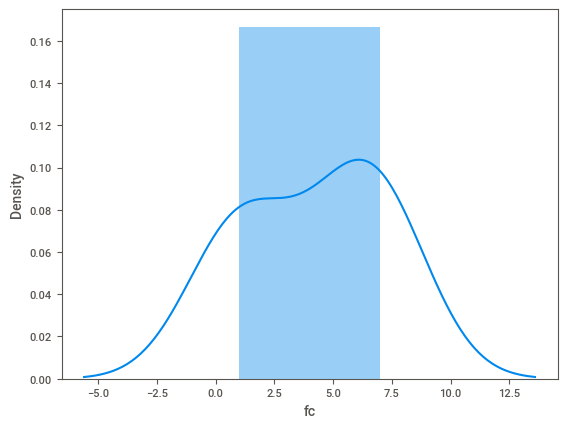

2 px_height
  Skewness is: -0.6334849297394821


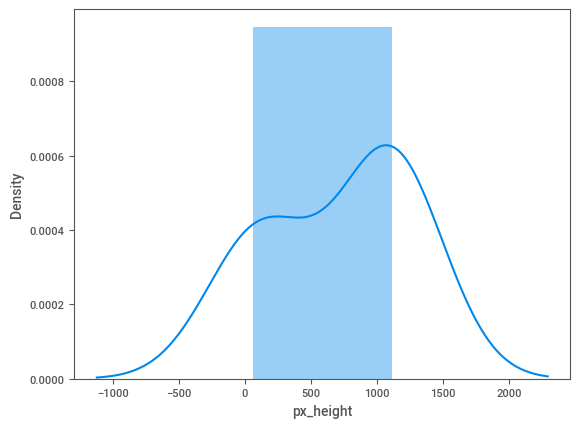

3 three_g
  Skewness is: 0.0


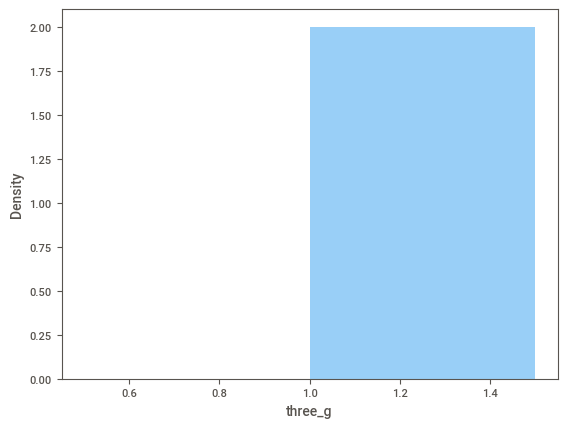

In [20]:
# To check skewness of a columns

j=1
for i in sk:
    print(j,i)
    print("  Skewness is:", sk[i].skew()) # Skewness is lies in between -5 to 5 range.
    
    plt.figure()
    sns.distplot(sk[i])
    plt.show()
    j+=1

**fc (Normal)**

In [21]:
#Basic info about column

df['fc'].describe()

count    2000.000000
mean        4.309500
std         4.341444
min         0.000000
25%         1.000000
50%         3.000000
75%         7.000000
max        19.000000
Name: fc, dtype: float64

In [22]:
#Here to used 3-sigma rule on fc column.

lower_limit=df['fc'].mean()-3*df['fc'].std()
upper_limit=df['fc'].mean()+3*df['fc'].std()
print("lower_limit",lower_limit)
print("upper_limit",upper_limit)

lower_limit -8.714831243951682
upper_limit 17.333831243951682


In [23]:
# Find value less than lower limit

df.loc[df['fc']>upper_limit]

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
95,1137,1,1.0,0,18,0,7,1.0,196,3,...,942,1179,3616,13,5,12,1,1,1,3
226,1708,1,2.4,1,18,1,49,0.1,109,1,...,233,517,3388,6,4,16,1,1,1,3
305,1348,0,2.0,0,18,0,52,0.3,98,3,...,1869,1942,955,18,11,7,1,1,1,1
1387,1533,1,1.1,1,18,1,17,0.3,160,4,...,1054,1393,2520,8,2,11,1,0,1,2
1406,1731,1,2.3,1,18,0,60,0.5,171,4,...,142,1039,1220,9,3,20,0,1,0,1
1416,1448,0,0.5,1,18,0,2,0.2,100,5,...,846,1144,593,9,4,18,1,1,1,0
1554,1957,0,1.2,1,18,1,36,0.8,151,2,...,1194,1727,1115,16,2,18,1,0,1,1
1693,695,0,0.5,0,18,1,12,0.6,196,2,...,1649,1829,2855,16,13,7,1,1,1,2
1705,1290,1,1.4,1,19,1,35,0.3,110,4,...,405,742,879,16,2,8,1,0,0,0
1880,1720,0,1.6,0,18,1,2,0.8,188,5,...,334,896,2522,10,5,2,1,0,1,2


In [24]:
# To find percentage of outliers.

len(df.loc[df['fc']>upper_limit] )/len(df)

0.006

In [25]:
# To find value below lower_limit.

df.loc[df['fc']<lower_limit]

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range


In [26]:
df.loc[df['fc']>upper_limit,"fc"]=df['fc'].mean()

In [27]:
# Check Outliers

df.loc[df['fc']>upper_limit]

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range


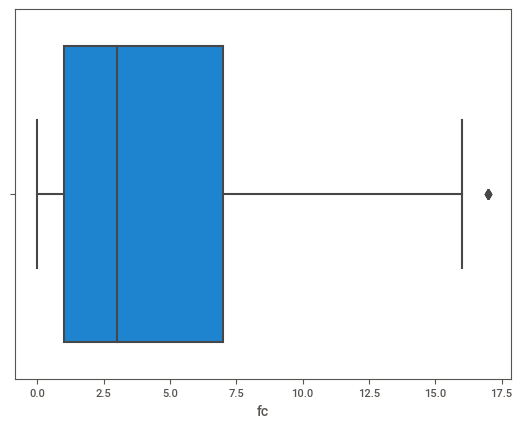

In [28]:
#Check outliers

sns.boxplot(x=df.fc)
plt.show()

**px_height (right skewed)**

In [29]:
#Basic info about px_height column

df['px_height'].describe()

count    2000.000000
mean      645.108000
std       443.780811
min         0.000000
25%       282.750000
50%       564.000000
75%       947.250000
max      1960.000000
Name: px_height, dtype: float64

In [30]:
# To find Q1 and Q3.
# To calculate quantiles using quantile().

Q1=df['px_height'].quantile(0.25) # 25%
print("lower_quantile",Q1)

Q3=df['px_height'].quantile(0.75) # 75%
print("upper_quantile",Q3)


lower_quantile 282.75
upper_quantile 947.25


In [31]:
# To Find IQR.

IQR=Q3-Q1
IQR

664.5

In [32]:
# To find lower limit and upper limit

lower_limit=Q1-1.5*IQR
print("lower_limit",lower_limit)

upper_limit=Q3+1.5*IQR
print("upper_limit",upper_limit)

lower_limit -714.0
upper_limit 1944.0


In [33]:
# To find value above upper_limit.

df.loc[df['px_height']>upper_limit] 

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
988,1413,1,0.5,1,4.0,1,45,0.4,104,5,...,1949,1994,2973,17,8,15,1,0,1,3
1771,1230,1,1.6,0,0.0,1,48,0.7,111,7,...,1960,1963,1622,18,17,16,1,1,1,2


In [34]:
# To find percentage of outliers.

len(df.loc[df['px_height']>upper_limit] )/len(df)

0.001

In [35]:
# To find value below lower_limit.

df.loc[df['px_height']<lower_limit] # There are no data in lower limit.

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range


In [36]:
#To replace outliers with median value
df.loc[df['px_height']>upper_limit,"px_height"]=df['px_height'].median()


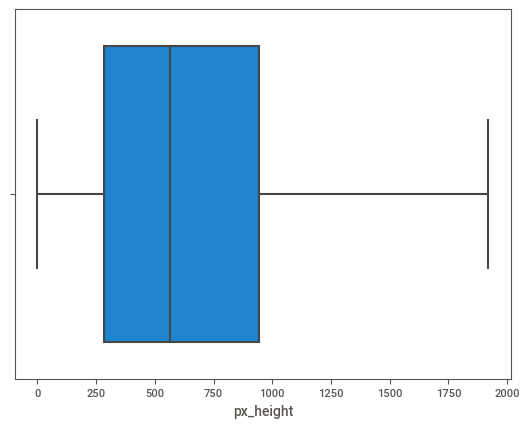

In [37]:
# Check Outliers

sns.boxplot(x=df['px_height'])
plt.show()

***ii).Scaling***

In [38]:
#To Show all columns
pd.set_option("display.max_columns", None)
df.sample(10)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
613,557,1,1.6,0,0.0,0,24,0.5,125,3,0,1131,1315,1305,12,8,3,1,0,1,0
623,644,1,1.3,1,7.0,1,30,0.5,114,1,16,1140,1654,2382,9,0,19,1,0,1,2
1043,1948,0,2.8,1,5.0,1,18,0.2,135,2,14,477,571,816,16,2,3,1,0,0,0
295,1162,0,2.0,0,0.0,1,56,0.7,114,7,1,56,997,1652,5,0,20,1,0,0,1
1417,1987,1,1.9,0,0.0,0,50,0.7,119,8,18,960,1925,857,12,4,6,1,1,0,1
1589,1765,0,1.1,0,3.0,0,11,0.7,87,2,7,835,1175,3695,6,5,18,1,0,0,3
429,1048,1,0.9,0,10.0,1,28,0.8,194,2,19,966,1975,1458,5,1,15,1,0,1,1
879,906,0,2.1,1,7.0,0,18,0.1,136,2,11,1102,1793,3412,13,8,16,1,0,0,3
104,553,0,2.4,1,1.0,1,8,0.5,121,7,3,325,902,1204,11,4,8,1,1,1,0
1375,1604,1,1.9,1,0.0,1,63,0.6,93,5,2,641,1156,1464,15,9,20,1,1,0,1


In [39]:
scale=MinMaxScaler() # for normalize data in the range of 0 to 1.

In [40]:
df[['battery_power','clock_speed','fc','int_memory','m_dep','mobile_wt','pc','px_height','px_width','ram']] = scale.fit_transform(df[['battery_power','clock_speed','fc','int_memory','m_dep','mobile_wt','pc','px_height','px_width','ram']])

In [41]:
df.sample(5)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
276,0.775551,0,0.00,0,0.000000,1,0.951613,0.777778,0.383333,4,0.65,0.016667,0.673565,0.936398,9,5,13,1,1,1,3
668,0.785571,0,0.52,1,0.235294,0,0.145161,0.666667,0.366667,6,0.40,0.141146,0.652203,0.939337,15,6,12,1,0,0,3
169,0.713427,0,0.92,1,1.000000,0,0.677419,0.222222,0.250000,4,1.00,0.023438,0.962617,0.268306,9,2,17,1,0,0,1
222,0.483634,1,0.64,1,0.470588,0,0.177419,0.444444,0.300000,4,0.60,0.395313,0.603471,0.956708,12,11,11,0,0,0,3
793,0.565130,0,0.16,1,0.470588,1,0.822581,0.777778,0.233333,6,0.75,0.500521,0.339119,0.956708,15,3,14,1,0,1,3


# 8.Feature Engineering

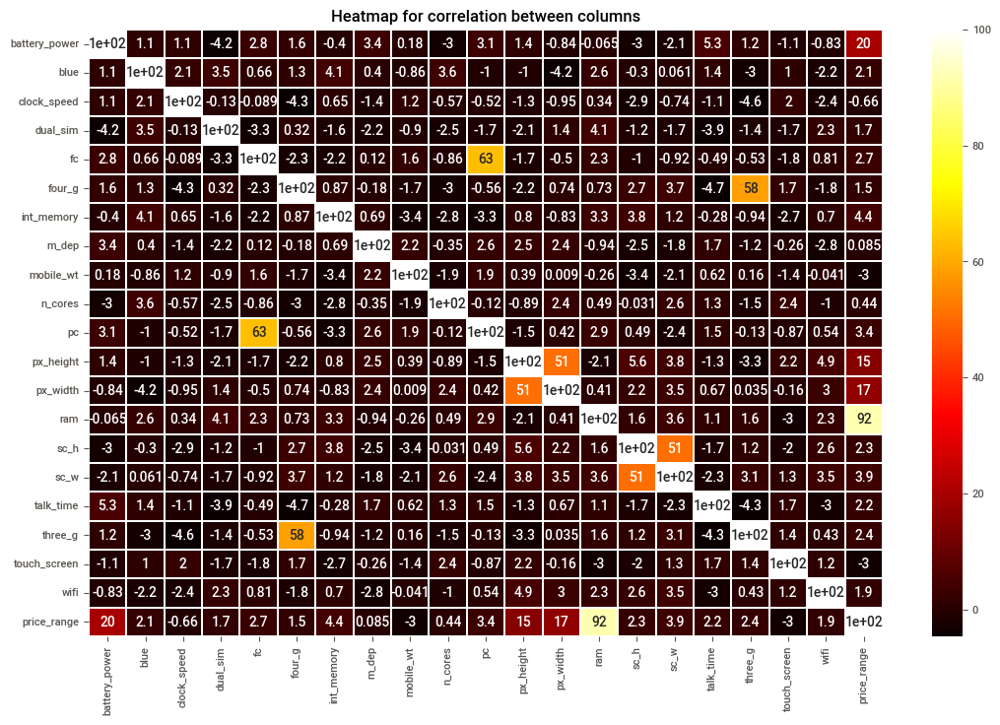

In [42]:
# Checking correlation using heatmap

plt.figure(figsize=(13,8))
sns.heatmap(df.corr()*100,annot=True,cmap='hot',linewidths=.1)
plt.title("Heatmap for correlation between columns")
plt.show()

In [43]:
df = df.drop(['fc','four_g','px_height','sc_h'], axis=1)

# 9.Split Data into x and y

In [44]:
# Defining x and y

X=df.iloc[:,:-1] # First to last index -1
y=df.price_range

In [45]:
X.sample(5)

,battery_power,blue,clock_speed,dual_sim,int_memory,m_dep,mobile_wt,n_cores,pc,px_width,ram,sc_w,talk_time,three_g,touch_screen,wifi
131,0.861055,0,0.80,1,0.000000,0.000000,0.866667,1,0.70,0.194927,0.296633,0,20,1,1,1
185,0.587174,1,0.64,1,0.032258,0.777778,0.100000,3,0.65,0.000000,0.144575,2,15,1,1,0
1437,0.956580,0,0.92,1,0.225806,0.444444,0.616667,3,0.45,0.649533,0.155532,2,18,0,1,0
1447,0.334669,0,0.88,1,0.145161,0.333333,0.875000,6,0.90,0.008011,0.188402,7,19,1,0,1
1688,0.114896,1,0.56,0,0.532258,0.333333,0.516667,6,0.70,0.714286,0.877873,17,4,1,0,1


In [46]:
y.sample(5)

1569    1
1687    0
1590    3
1604    0
1030    2
Name: price_range, dtype: int64

# 10.Split data for trainning and testing

In [47]:
## preparing training 75% and testing 25% data

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [48]:
X_train.shape ,X_test.shape, y_train.shape, y_test.shape

((1500, 16), (500, 16), (1500,), (500,))

# 11.Model Building And Evaluation

**Logistic Regression**

In [49]:
LR = LogisticRegression()

In [50]:
LR.fit(X_train,y_train)

LogisticRegression()

In [51]:
y_pred = LR.predict(X_test)

In [52]:
print("Accuracy of Logistic Regression",accuracy_score(y_test,y_pred))

Accuracy of Logistic Regression 0.852


In [53]:
print("Logistic Regression Confusion Matrix\n")
pd.DataFrame(confusion_matrix(y_test,y_pred))

Logistic Regression Confusion Matrix



,0,1,2,3
0,126,6,0,0
1,8,92,18,0
2,0,17,92,11
3,0,0,14,116


In [54]:
print("Classification Report:-\n")
print(classification_report(y_test, y_pred))

Classification Report:-

              precision    recall  f1-score   support

           0       0.94      0.95      0.95       132
           1       0.80      0.78      0.79       118
           2       0.74      0.77      0.75       120
           3       0.91      0.89      0.90       130

    accuracy                           0.85       500
   macro avg       0.85      0.85      0.85       500
weighted avg       0.85      0.85      0.85       500



**Decision Tree Classifier**

In [55]:
DT = DecisionTreeClassifier()

In [56]:
DT.fit(X_train,y_train)

DecisionTreeClassifier()

In [57]:
y_pred = DT.predict(X_test)

In [58]:
print("Accuracy of Decision Tree",accuracy_score(y_test,y_pred))

Accuracy of Decision Tree 0.812


In [59]:
print("Decision Tree Classifier Confusion Matrix\n")
pd.DataFrame(confusion_matrix(y_test,y_pred))

Decision Tree Classifier Confusion Matrix



,0,1,2,3
0,116,16,0,0
1,12,95,11,0
2,0,23,82,15
3,0,0,17,113


In [60]:
print("Classification Report:-\n")
print(classification_report(y_test, y_pred))

Classification Report:-

              precision    recall  f1-score   support

           0       0.91      0.88      0.89       132
           1       0.71      0.81      0.75       118
           2       0.75      0.68      0.71       120
           3       0.88      0.87      0.88       130

    accuracy                           0.81       500
   macro avg       0.81      0.81      0.81       500
weighted avg       0.82      0.81      0.81       500



**Support Vector Classifier**

In [61]:
sv=SVC()

In [62]:
sv.fit(X_train,y_train)

SVC()

In [63]:
y_pred = sv.predict(X_test)

In [64]:
print("Accuracy of SVC",accuracy_score(y_test,y_pred))

Accuracy of SVC 0.372


In [65]:
print("SVC Confusion Matrix\n")
pd.DataFrame(confusion_matrix(y_test,y_pred))

SVC Confusion Matrix



,0,1,2,3
0,35,72,23,2
1,16,70,27,5
2,4,56,56,4
3,1,53,51,25


In [66]:
print("Classification Report:-\n")
print(classification_report(y_test, y_pred))

Classification Report:-

              precision    recall  f1-score   support

           0       0.62      0.27      0.37       132
           1       0.28      0.59      0.38       118
           2       0.36      0.47      0.40       120
           3       0.69      0.19      0.30       130

    accuracy                           0.37       500
   macro avg       0.49      0.38      0.36       500
weighted avg       0.50      0.37      0.36       500



*******************************

# Using Priciple Component Analysis (PCA)

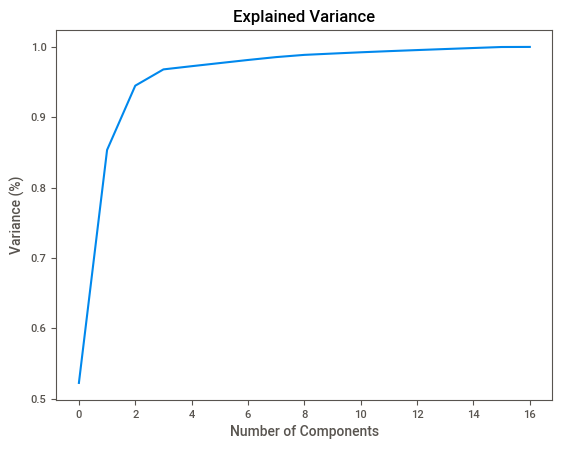

In [67]:
## getting the optimal number of pca


# Initialize the PCA object

pca = PCA()# creating the object
principalComponents = pca.fit_transform(df)
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_)) #np.cumcum-Return the cumulativesum of theelements along a given axis.
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)') #for each component
plt.title('Explained Variance')
plt.show()

In [68]:
pca = PCA(n_components=10)
new_data = pca.fit_transform(df)
# This will be the new data fed to the algorithm.
pri_Df = pd.DataFrame(data = new_data
             , columns = ['principal component 1', 'principal component 2','principal component 3','principal component 4','principal component 5','principal component 6', 'principal component 7','principal component 8','principal component 9','principal component 10'])

In [69]:
pri_Df.head()

,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5,principal component 6,principal component 7,principal component 8,principal component 9,principal component 10
0,-7.900624,1.570765,2.603809,0.551693,-0.552036,-0.275926,0.545864,0.450803,0.792452,0.239317
1,3.875585,-2.984037,1.431948,-0.585398,0.616530,0.298971,-0.556261,-0.419103,-0.284033,-0.477942
2,1.816931,-3.845715,-0.573265,-0.555335,0.617975,0.280241,-0.536503,-0.439435,-0.295445,-0.562269
3,0.108963,2.263425,-1.446060,-0.491887,0.082335,0.841936,0.211135,0.425666,-0.236986,0.184242
4,-4.158092,-3.619152,2.469696,0.490239,-0.044445,0.686827,-0.723836,0.199638,-0.277900,-0.196351


***Build a PCA model***

In [70]:
# Defining x and y

X_pca=pri_Df # First to last index -1
y=df.price_range

In [71]:
X_pca.sample(5)

,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5,principal component 6,principal component 7,principal component 8,principal component 9,principal component 10
880,-8.110271,-2.381228,-0.460502,1.544295,0.082581,0.165548,0.754905,-0.631380,-0.242082,0.314633
300,-3.063604,-1.667527,3.497899,-1.573364,-0.077712,0.717623,-0.752997,0.187030,-0.220247,-0.065821
29,1.076922,1.175683,-0.455305,1.581309,-0.674504,-0.313689,0.572235,0.425068,-0.244315,-0.249619
1599,4.033031,-0.012379,3.491252,-1.593955,0.015768,0.031716,0.132329,0.999636,-0.277472,-0.283646
1493,7.850490,-3.110887,-3.584878,1.436910,0.771438,0.427375,0.420383,-0.083044,-0.371561,-0.141530


In [72]:
y.sample(5)

1427    1
1400    3
542     1
983     1
133     1
Name: price_range, dtype: int64

*********

In [73]:
## preparing training 75% and testing 25% data

X_train_pca, X_test_pca, y_train, y_test = train_test_split(X_pca, y, test_size=0.25, random_state=42)

In [74]:
X_train_pca.shape ,X_test_pca.shape, y_train.shape, y_test.shape

((1500, 10), (500, 10), (1500,), (500,))

******

***Logistic Regression for PCA***

In [75]:
LR = LogisticRegression()

In [76]:
LR.fit(X_train_pca,y_train)

LogisticRegression()

In [77]:
y_pred = LR.predict(X_test_pca)
y_pred

array([0, 2, 1, 3, 1, 1, 2, 0, 3, 1, 0, 0, 2, 3, 3, 2, 3, 3, 1, 0, 0, 2,
       1, 2, 0, 1, 3, 2, 2, 0, 0, 0, 3, 0, 1, 1, 2, 0, 3, 0, 2, 3, 2, 0,
       2, 3, 2, 1, 3, 1, 3, 1, 0, 0, 1, 0, 1, 3, 0, 0, 1, 3, 3, 1, 0, 0,
       3, 3, 1, 2, 2, 2, 0, 1, 2, 0, 1, 3, 2, 2, 3, 2, 1, 0, 1, 3, 1, 3,
       3, 0, 3, 3, 2, 1, 3, 2, 2, 3, 1, 1, 0, 0, 1, 0, 0, 3, 2, 0, 1, 1,
       0, 0, 3, 1, 3, 2, 3, 2, 0, 2, 1, 3, 2, 1, 3, 3, 0, 2, 0, 2, 3, 0,
       2, 2, 0, 3, 1, 0, 0, 2, 2, 1, 3, 2, 0, 0, 0, 1, 1, 2, 3, 1, 1, 0,
       2, 2, 0, 1, 0, 2, 2, 3, 3, 2, 1, 0, 1, 2, 2, 3, 3, 0, 1, 0, 3, 1,
       1, 2, 1, 0, 0, 0, 0, 0, 3, 2, 0, 3, 0, 0, 0, 0, 1, 3, 3, 1, 0, 1,
       1, 1, 1, 2, 2, 3, 3, 3, 1, 2, 0, 0, 0, 2, 1, 1, 3, 1, 0, 2, 1, 1,
       3, 2, 3, 0, 0, 2, 1, 3, 0, 1, 2, 0, 2, 3, 2, 0, 1, 3, 3, 0, 1, 3,
       2, 3, 0, 3, 1, 2, 3, 3, 2, 1, 0, 3, 3, 1, 3, 3, 3, 3, 3, 0, 1, 2,
       2, 2, 3, 0, 2, 3, 2, 2, 2, 1, 0, 2, 0, 3, 3, 1, 3, 1, 0, 3, 1, 2,
       0, 0, 3, 0, 1, 2, 3, 3, 3, 1, 1, 0, 1, 3, 3,

In [78]:
print("Accuracy of Logistic Regression",accuracy_score(y_test,y_pred))

Accuracy of Logistic Regression 1.0


In [79]:
print("Decision Tree Classifier Confusion Matrix\n")
pd.DataFrame(confusion_matrix(y_test,y_pred))

Decision Tree Classifier Confusion Matrix



,0,1,2,3
0,132,0,0,0
1,0,118,0,0
2,0,0,120,0
3,0,0,0,130


In [80]:
print("Classification Report:-\n")
print(classification_report(y_test, y_pred))

Classification Report:-

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       132
           1       1.00      1.00      1.00       118
           2       1.00      1.00      1.00       120
           3       1.00      1.00      1.00       130

    accuracy                           1.00       500
   macro avg       1.00      1.00      1.00       500
weighted avg       1.00      1.00      1.00       500



****Support Vector Classifier For PCA****

In [81]:
sv=SVC()

In [82]:
sv.fit(X_train_pca,y_train)

SVC()

In [83]:
y_pred = sv.predict(X_test_pca)

In [84]:
print("Accuracy of SVC",accuracy_score(y_test,y_pred))

Accuracy of SVC 0.994


In [85]:
print("SVC Confusion Matrix\n")
pd.DataFrame(confusion_matrix(y_test,y_pred))

SVC Confusion Matrix



,0,1,2,3
0,131,1,0,0
1,0,118,0,0
2,0,2,118,0
3,0,0,0,130


In [86]:
print("Classification Report:-\n")
print(classification_report(y_test, y_pred))

Classification Report:-

              precision    recall  f1-score   support

           0       1.00      0.99      1.00       132
           1       0.98      1.00      0.99       118
           2       1.00      0.98      0.99       120
           3       1.00      1.00      1.00       130

    accuracy                           0.99       500
   macro avg       0.99      0.99      0.99       500
weighted avg       0.99      0.99      0.99       500

